# Image Matching

In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps
from scipy.spatial import cKDTree
from skimage.feature import plot_matches
from skimage.measure import ransac
from skimage.transform import AffineTransform
from six import BytesIO
import tensorflow as tf
import tensorflow_hub as hub
from six.moves.urllib.request import urlopen
import cv2
import imutils
import glob
import os
from itertools import accumulate
import sys
sys.path.append('/home/tung/playground/delf_instance_retrieval/delf/delf/python/examples/')
from utils import download_and_resize_image, resize_image, show_images, image_input_fn, match_images

np.random.seed(10)

In [ ]:
#!pip install scikit-image
#!pip install tensorflow-hub
#!pip install opencv-python
#!pip install imutils

## Match an image pair

In [1]:
image_1_path = '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000005.jpg'# oxford_000317.jpg'
#features_1_path = '/home/tung/playground/data/oxford5k/oxford5k_features/oxford_000317.delf' #oxford_000773.delf'
#features_1_path = image_1_path.replace('images', 'features').replace('jpg', 'delf')

image_2_path = '/home/tung/playground/data/oxford5k/oxford5k_images/hertford_000056.jpg'
#features_2_path = '/home/tung/playground/data/oxford5k/oxford5k_features/hertford_000056.delf'
#features_2_path = image_2_path.replace('images', 'features').replace('jpg', 'delf')


In [2]:
#IMAGE_1_URL = 'https://images.unsplash.com/photo-1522184808165-a39a75502037?ixlib=rb-0.3.5&ixid=eyJhcHBfaWQiOjEyMDd9&s=9058a9f269234b4d7b6dc7bd7066d7e8&auto=format&fit=crop&w=1350&q=80'
#IMAGE_2_URL = 'https://images.unsplash.com/photo-1479660656269-197ebb83b540?ixlib=rb-0.3.5&ixid=eyJhcHBfaWQiOjEyMDd9&s=88b85498e4c076fce0ed0c086543afb6&auto=format&fit=crop&w=1952&q=80'

#IMAGE_1_JPG = '3_1.jpg'
#IMAGE_2_JPG = '3_2.jpg'

#IMAGE_1_URL = '../images/' + IMAGE_1_JPG
#IMAGE_2_URL = '../images/' + IMAGE_2_JPG

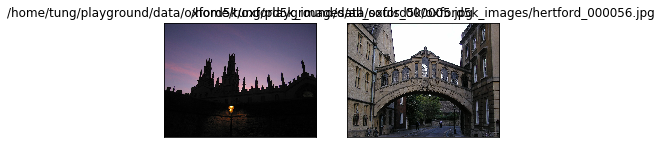

In [4]:
#resize_image(IMAGE_1_URL, IMAGE_1_JPG)
#resize_image(IMAGE_2_URL, IMAGE_2_JPG)
#download_and_resize_image(IMAGE_1_URL, IMAGE_1_JPG)
#download_and_resize_image(IMAGE_2_URL, IMAGE_2_JPG)

show_images([image_1_path, image_2_path])

In [5]:
# load delf model

tf.reset_default_graph()
tf.logging.set_verbosity(tf.logging.FATAL)

# load model
m = hub.Module('https://tfhub.dev/google/delf/1')

# The module operates on a single image at a time, so define a placeholder to
# feed an arbitrary image in.
image_placeholder = tf.placeholder(
    tf.float32, shape=(None, None, 3), name='input_image')

module_inputs = {
    'image': image_placeholder, # Image tensor with dtype float32 and shape [height, width, 3]
    'score_threshold': 100.0, # Image features whose attention score exceeds this threshold will be returned
    'image_scales': [0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0],
    'max_feature_num': 1000, # The maximum number of features that should be returned
}

# Apply the DELF module to the inputs to get the outputs.
module_outputs = m(module_inputs, as_dict=True)

In [7]:
#image_tf = image_input_fn([IMAGE_1_JPG, IMAGE_2_JPG])
image_tf = image_input_fn([image_1_path, image_2_path])


with tf.train.MonitoredSession() as sess:
    results_dict = {}  # Stores the locations and their descriptors for each image
    #for image_path in [IMAGE_1_JPG, IMAGE_2_JPG]:
    for image_path in [image_1_path, image_2_path]:
        image = sess.run(image_tf)
        print('Extracting locations and descriptors from %s' % image_path)
        results_dict[image_path] = sess.run(
            [module_outputs['locations'], module_outputs['descriptors']],
            feed_dict={image_placeholder: image})

# delf_outputs is a dictionary of named tensors:
# * delf_outputs['locations']: a Tensor with dtype float32 and shape [None, 2],
#   where each entry is a coordinate (vertical-offset, horizontal-offset) in
#   pixels from the top-left corner of the image.
# * delf_outputs['descriptors']: a Tensor with dtype float32 and shape
#   [None, 40], where delf_outputs['descriptors'][i] is a 40-dimensional
#   descriptor for the image at location delf_outputs['locations'][i].

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000005.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/hertford_000056.jpg


Loaded image 1's 882 features
Loaded image 2's 1000 features


/usr/local/lib/python3.6/dist-packages/skimage/transform/_geometric.py:683: RuntimeWarning: divide by zero encountered in true_divide
  H.flat[list(self._coeffs) + [8]] = - V[-1, :-1] / V[-1, -1]
/usr/local/lib/python3.6/dist-packages/skimage/measure/fit.py:831: RuntimeWarning: invalid value encountered in less
  sample_model_inliers = sample_model_residuals < residual_threshold


Found 8 inliers


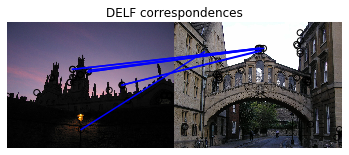

In [8]:
#match_images(results_dict, IMAGE_1_JPG, IMAGE_2_JPG)
match_images(results_dict, image_1_path, image_2_path)

## Match a query to the database

In [ ]:
'''
import csv
import codecs
building_descs = []
f = codecs.open('./images/buildings.csv', 'rU', encoding='utf-8-sig')
reader = csv.reader(f)
for utf8_row in reader:
    building_descs.append(utf8_row[0])
building_descs
'''

### Resize all database images

In [11]:
'''
# What database are you working on?
database = 'InLoc'
database_path = os.path.join('/home/tung/playground/data', database, )

# Check if database_path exists
if not os.path.isdir(database_path):
    print("Database does NOT exists! Please verify!")
else:
    print("Database exists!")
'''


Database exists!


In [9]:
database = 'oxford5k'
database_root_path = '/home/tung/playground/data/oxford5k/'
database_image_path = os.path.join(database_root_path, 'oxford5k_images')
database_delf_path = os.path.join(database_root_path, 'oxford5k_features')

# Check if database_path exists
if not os.path.isdir(database_image_path):
    print("Database does NOT exists! Please verify!")
else:
    print("Database exists!")

Database exists!


In [8]:
'''
# Resize one single image
def resize_image(srcfile, destfile, new_width=256, new_height=256):
    pil_image = Image.open(srcfile)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert('RGB')
    pil_image_rgb.save(destfile, format='JPEG', quality=90)
    return destfile
# Resized the whole image folder, and put it in the same 
def resize_images_folder(srcfolder, destfolder=os.path.join(database_path, 'resized'), new_width=256, new_height=256):
    os.makedirs(destfolder,exist_ok=True)
    for srcfile in glob.iglob(os.path.join(srcfolder, '*.[Jj][Pp][Gg]')):
        src_basename = os.path.basename(srcfile)
        destfile=os.path.join(destfolder,src_basename)
        resize_image(srcfile, destfile, new_width, new_height)
    return destfolder
def get_resized_db_image_paths(destfolder=os.path.join(database_path, 'resized')):
    return sorted(list(glob.iglob(os.path.join(destfolder, '*.[Jj][Pp][Gg]'))))
'''

In [10]:
#resize_images_folder('/home/tung/playground/data/InLoc/database_cutouts_imageonly/CSE3/001')

'/home/tung/playground/data/InLoc/resized'

In [10]:
#for dir, subdirs, files in os.walk(database_path):
#    resize_images_folder(os.path.abspath(dir))

NameError: name 'database_path' is not defined

In [12]:
def get_db_image_paths(destfolder):
    return sorted(list(glob.iglob(os.path.join(destfolder, '*.[Jj][Pp][Gg]'))))

In [13]:
#db_images = get_resized_db_image_paths()
db_images = get_db_image_paths(database_image_path)
db_images

['/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000000.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000001.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000002.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000003.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000005.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000006.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000007.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000008.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000010.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000011.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000012.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000013.jpg',
 '/home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000014.jpg',

In [14]:
tf.reset_default_graph()
tf.logging.set_verbosity(tf.logging.FATAL)

m = hub.Module('https://tfhub.dev/google/delf/1')

# The module operates on a single image at a time, so define a placeholder to
# feed an arbitrary image in.
image_placeholder = tf.placeholder(
    tf.float32, shape=(None, None, 3), name='input_image')

module_inputs = {
    'image': image_placeholder,
    'score_threshold': 100.0,
    'image_scales': [0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0],
    'max_feature_num': 1000,
}

module_outputs = m(module_inputs, as_dict=True)

image_tf = image_input_fn(db_images)

with tf.train.MonitoredSession() as sess:
    results_dict = {}  # Stores the locations and their descriptors for each image
    for image_path in db_images:
        image = sess.run(image_tf)
        print('Extracting locations and descriptors from %s' % image_path)
        results_dict[image_path] = sess.run(
            [module_outputs['locations'], module_outputs['descriptors']],
            feed_dict={image_placeholder: image})

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000000.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000001.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000002.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000003.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000005.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000006.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000007.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000008.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000106.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000107.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000110.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000114.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000117.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000119.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000120.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/all_souls_000126.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000036.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000052.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000058.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000059.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000060.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000061.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000062.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000063.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000185.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000186.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000187.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000188.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000192.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000193.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000196.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000197.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000279.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000280.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000281.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000283.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000285.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000286.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000287.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ashmolean_000288.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000047.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000048.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000049.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000050.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000051.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000052.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000053.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000054.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ba

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000147.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000148.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000149.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000151.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000152.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000153.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000154.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/balliol_000155.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/ba

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000060.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000061.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000062.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000067.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000069.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000070.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000073.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000255.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000258.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000262.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000264.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000265.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000267.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000275.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000282.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000391.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000395.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000396.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000398.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000400.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000401.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000405.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/bodleian_000407.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000073.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000074.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000076.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000077.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000078.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000079.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000081.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000177.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000178.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000179.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000180.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000181.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000182.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000183.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000184.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000319.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000320.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000321.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000322.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000323.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000324.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000325.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000326.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000410.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000412.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000413.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000414.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000416.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000418.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000419.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000420.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000627.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000629.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000630.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000631.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000632.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000638.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000639.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000641.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000806.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000807.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000808.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000810.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000811.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000813.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000814.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000815.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000975.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000976.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000977.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000980.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000983.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000984.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000985.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_000986.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001063.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001064.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001067.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001068.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001069.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001070.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001071.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/christ_church_001078.jpg
Extracting locations and descriptors from /home/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000120.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000122.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000124.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000131.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000132.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000133.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000136.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/cornmarket_000138.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxf

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/hertford_000127.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/hertford_000128.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/hertford_000131.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/hertford_000133.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000000.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000001.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000002.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000003.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000278.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000279.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000280.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000281.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000282.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000283.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000284.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000285.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000286.jpg
E

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000368.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000369.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000371.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000372.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000381.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000382.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000383.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000384.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/jesus_000386.jpg
E

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000107.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000108.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000111.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000113.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000118.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000126.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000137.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000143.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/keble_000155.jpg
E

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000014.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000018.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000020.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000022.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000023.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000024.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000025.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000026.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000140.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000141.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000142.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000143.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000144.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000145.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000146.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000147.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000224.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000225.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000226.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000227.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000228.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000229.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000230.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000231.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000313.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000316.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000317.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000319.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000320.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000325.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000328.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000330.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000485.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000486.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000488.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000489.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000490.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000493.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000494.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000495.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000604.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000605.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000607.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000608.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000609.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000610.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000611.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000613.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000709.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000710.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000712.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000713.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000719.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000720.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000722.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000723.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000838.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000843.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000844.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000847.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000849.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000850.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000851.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_000852.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001008.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001009.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001010.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001011.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001012.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001013.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001014.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001015.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001127.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001137.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001139.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001140.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001141.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001142.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001143.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/magdalen_001144.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_i

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000161.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000164.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000168.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000170.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000172.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000175.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000180.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000184.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000185.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000361.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000362.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000363.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000364.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000365.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000368.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000369.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000370.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000371.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000479.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000480.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000481.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000482.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000483.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000484.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000485.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000486.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000487.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000731.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000732.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000733.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000735.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000738.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000739.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000740.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000741.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000746.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000905.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000906.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000908.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000909.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000913.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000914.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000915.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000917.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_000921.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001066.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001067.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001070.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001071.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001073.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001074.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001075.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/new_001076.jpg
Extracting location

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000070.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000071.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000073.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000074.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000075.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000076.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000077.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oriel_000078.jpg
E

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000065.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000068.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000071.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000073.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000074.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000076.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000078.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000259.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000262.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000264.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000266.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000273.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000277.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000280.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000281.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000456.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000457.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000458.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000460.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000461.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000476.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000477.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000478.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000627.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000633.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000635.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000636.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000637.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000638.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000646.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000655.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000789.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000803.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000805.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000808.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000809.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000811.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000812.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000814.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000976.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000978.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000983.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000984.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000985.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000986.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000987.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000989.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001159.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001167.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001169.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001173.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001175.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001186.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001188.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001189.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001342.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001343.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001344.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001348.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001349.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001350.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001353.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001354.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001512.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001514.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001516.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001517.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001520.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001521.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001522.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001523.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001721.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001722.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001723.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001724.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001725.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001726.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001727.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001728.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001902.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001903.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001904.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001905.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001906.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001911.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001913.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001920.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_001

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002090.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002100.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002103.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002104.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002105.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002106.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002107.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002111.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002276.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002277.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002278.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002279.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002282.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002283.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002284.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002286.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002422.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002424.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002428.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002431.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002457.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002461.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002462.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002464.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002623.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002624.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002625.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002627.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002629.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002639.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002646.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002650.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002821.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002823.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002834.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002837.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002839.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002840.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002841.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002842.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_002

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003009.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003010.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003011.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003012.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003014.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003015.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003016.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003020.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003142.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003143.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003144.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003145.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003149.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003153.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003154.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003156.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003321.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003322.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003325.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003326.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003327.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003328.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003329.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003330.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003513.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003515.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003518.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003520.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003521.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003528.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003529.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003530.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_003

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000027.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000028.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000030.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000031.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000032.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000033.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000035.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000036.jpg
Extracting locations and descriptors from /home/tung/playground/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000148.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000149.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000153.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000157.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000163.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000164.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000166.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/pitt_rivers_000172.jpg
Extracting locations and descriptors from /home/tung/playground/

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000100.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000103.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000104.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000105.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000106.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000107.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000108.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000112.jpg
Extracting locations and

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000231.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000232.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000233.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000234.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000235.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000238.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000239.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000240.jpg
Extracting locations and

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000351.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000354.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000360.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000361.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000362.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000364.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000366.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000367.jpg
Extracting locations and

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000509.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000512.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000515.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000516.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000518.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000519.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000520.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/radcliffe_camera_000522.jpg
Extracting locations and

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000066.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000067.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000068.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000069.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000070.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000071.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000072.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000075.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/tr

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000194.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000195.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000196.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000197.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000198.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000200.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000203.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000204.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/tr

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000340.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000341.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000344.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000352.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000355.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000359.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000360.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/trinity_000362.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/tr

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000143.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000144.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000145.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000147.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000150.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000159.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000173.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/worcester_000174.jpg
Extracting locations and descriptors from /home/tung/playground/data/oxford5k/ox

In [20]:
import json

database = 'oxford5k'
database_root_path = '/home/tung/playground/data/oxford5k/'
database_image_path = os.path.join(database_root_path, 'oxford5k_images')
database_delf_path = os.path.join(database_root_path, 'oxford5k_features')

# There's an issue saving np array with json
#with open(database_root_path + '/' + database + '_delf_features.json', 'w') as f:
#    json.dump(results_dict, f, sort_keys=True, indent=4)

try:
    import cPickle as pickle
except ImportError:  # python 3.x
    import pickle

with open(database_root_path + '/' + database + '_delf_features.p', 'wb') as fp:
    pickle.dump(results_dict, fp, protocol=pickle.HIGHEST_PROTOCOL)
#results_dict

In [22]:
with open(database_root_path + '/' + database + '_delf_features.p', 'rb') as fp:
    data = pickle.load(fp)
#print(data)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [25]:
def compute_locations_and_descriptors(image_path):
    tf.reset_default_graph()
    tf.logging.set_verbosity(tf.logging.FATAL)

    m = hub.Module('https://tfhub.dev/google/delf/1')

    # The module operates on a single image at a time, so define a placeholder to
    # feed an arbitrary image in.
    image_placeholder = tf.placeholder(
        tf.float32, shape=(None, None, 3), name='input_image')

    module_inputs = {
        'image': image_placeholder,
        'score_threshold': 100.0,
        'image_scales': [0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0],
        'max_feature_num': 1000,
    }

    module_outputs = m(module_inputs, as_dict=True)

    image_tf = image_input_fn([image_path])

    with tf.train.MonitoredSession() as sess:
        image = sess.run(image_tf)
        print('Extracting locations and descriptors from %s' % image_path)
        return sess.run(
            [module_outputs['locations'], module_outputs['descriptors']],
            feed_dict={image_placeholder: image})

### Aggregate all database images' locations and descriptors to lists
Calculate accumulated/aggregated indexes boundaries per image so we can reverse search the image index given an accumulated/aggregated index.

In [26]:
locations_agg = np.concatenate([results_dict[img][0] for img in db_images])
descriptors_agg = np.concatenate([results_dict[img][1] for img in db_images])
accumulated_indexes_boundaries = list(accumulate([results_dict[img][0].shape[0] for img in db_images]))

In [45]:
locations_agg = np.concatenate([data[img][0] for img in db_images])
descriptors_agg = np.concatenate([data[img][1] for img in db_images])
accumulated_indexes_boundaries = list(accumulate([data[img][0].shape[0] for img in db_images]))

### Build KD tree with database images' descriptors

In [46]:
d_tree = cKDTree(descriptors_agg) # build the KD tree

## Query a new image

In [84]:
'''
query_image = '/home/tung/playground/delf_instance_retrieval/delf/delf/python/examples/images/IMG_0818.JPG'
def preprocess_query_image(imagepath):
    '''
    Resize the query image and return the resized image path.
    '''
    query_temp_folder_name = 'query_temp_folder'
    query_temp_folder = os.path.join(os.path.dirname(query_image), query_temp_folder_name)
    os.makedirs(query_temp_folder,exist_ok=True)
    query_basename = os.path.basename(query_image)
    destfile=os.path.join(query_temp_folder,query_basename)
    resized_image = resize_image(query_image, destfile)
    return resized_image

resized_image = preprocess_query_image(query_image)
'''

In [47]:
query_image_path = '/home/tung/playground/data/oxford5k/oxford5k_images/oxford_000317.jpg'

In [48]:
query_image_locations, query_image_descriptors = compute_locations_and_descriptors(query_image_path)

Extracting locations and descriptors from /home/tung/playground/data/oxford5k/oxford5k_images/oxford_000317.jpg


### Query the KD tree to find K nearest neighbors for each descriptor

In [49]:
distance_threshold = 0.8
# K nearest neighbors
K = 10
distances, indices = d_tree.query(
    query_image_descriptors, distance_upper_bound=distance_threshold, k = K, n_jobs=-1)

# Find the list of unique accumulated/aggregated indexes
unique_indices = np.array(list(set(indices.flatten())))

unique_indices.sort()
if unique_indices[-1] == descriptors_agg.shape[0]:
    unique_indices = unique_indices[:-1]

## Get a list of database candidate image indexes
Look up a list of unique image indexes, each image contains at least one of K nearest neighbor result descriptors.
By reverse indexes look up.

In [50]:
unique_image_indexes = np.array(
    list(set([np.argmax([np.array(accumulated_indexes_boundaries)>index]) 
              for index in unique_indices])))
unique_image_indexes

array([   2,    4,    6, ..., 5057, 5059, 5061])

In [39]:
def image_index_2_accumulated_indexes(index, accumulated_indexes_boundaries):
    '''
    Image index to accumulated/aggregated locations/descriptors pair indexes.
    '''
    if index > len(accumulated_indexes_boundaries) - 1:
        return None
    accumulated_index_start = None
    accumulated_index_end = None
    if index == 0:
        accumulated_index_start = 0
        accumulated_index_end = accumulated_indexes_boundaries[index]
    else:
        accumulated_index_start = accumulated_indexes_boundaries[index-1]
        accumulated_index_end = accumulated_indexes_boundaries[index]
    return np.arange(accumulated_index_start,accumulated_index_end)

In [40]:
def get_locations_2_use(image_db_index, k_nearest_indices, accumulated_indexes_boundaries):
    '''
    Get a pair of locations to use, the query image to the database image with given index.
    Return: a tuple of 2 numpy arrays, the locations pair.
    '''
    image_accumulated_indexes = image_index_2_accumulated_indexes(image_db_index, accumulated_indexes_boundaries)
    locations_2_use_query = []
    locations_2_use_db = []
    for i, row in enumerate(k_nearest_indices):
        for acc_index in row:
            if acc_index in image_accumulated_indexes:
                locations_2_use_query.append(query_image_locations[i])
                locations_2_use_db.append(locations_agg[acc_index])
                break
    return np.array(locations_2_use_query), np.array(locations_2_use_db)
            

### Perform geometric verification using RANSAC and visualization

Found inliers for image 6 -> 3


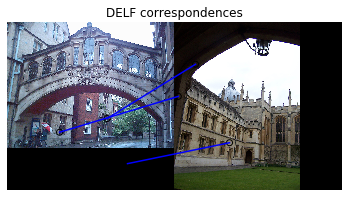

Found inliers for image 10 -> 2


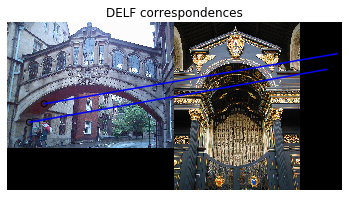

Found inliers for image 16 -> 2


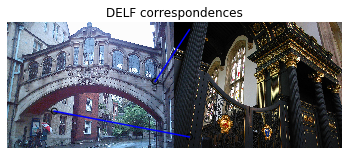

Found inliers for image 21 -> 2


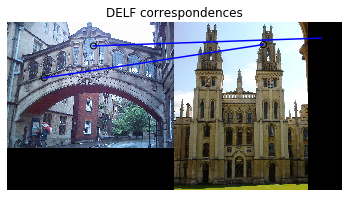

Found inliers for image 23 -> 3


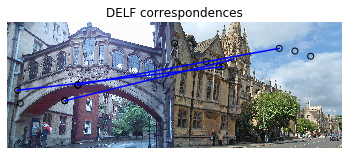

Found inliers for image 25 -> 3


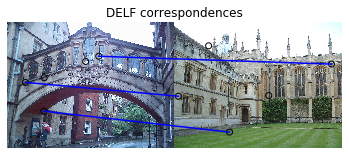

Found inliers for image 27 -> 3


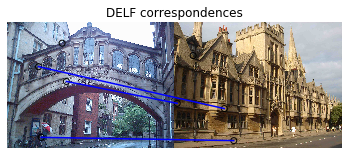

Found inliers for image 30 -> 3


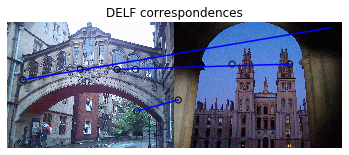

Found inliers for image 38 -> 3


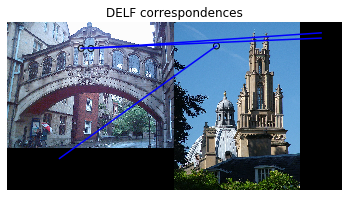

Found inliers for image 43 -> 2


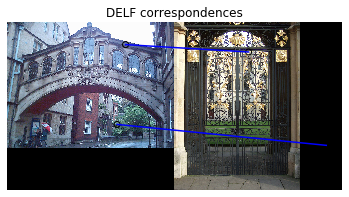

Found inliers for image 46 -> 3


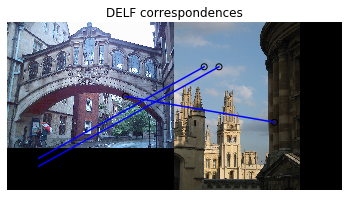

Found inliers for image 48 -> 2


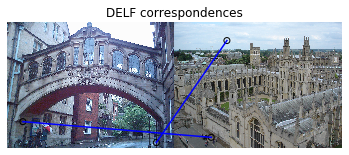

Found inliers for image 49 -> 3


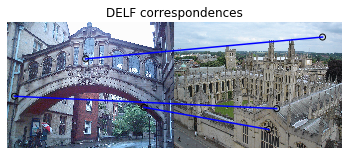

Found inliers for image 52 -> 3


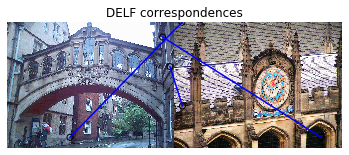

Found inliers for image 55 -> 27


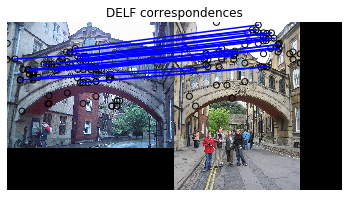

Found inliers for image 56 -> 9


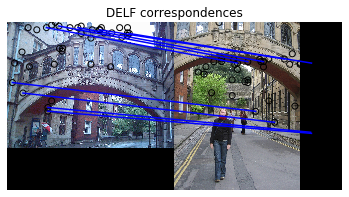

Found inliers for image 57 -> 2


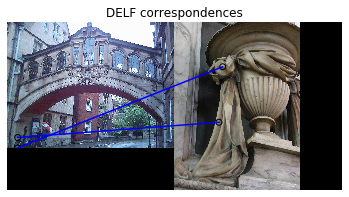

Found inliers for image 64 -> 2


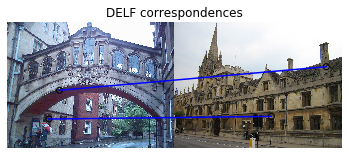

Found inliers for image 67 -> 3


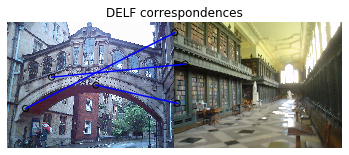

Found inliers for image 68 -> 2


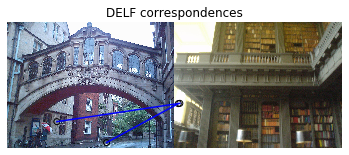

Found inliers for image 69 -> 2


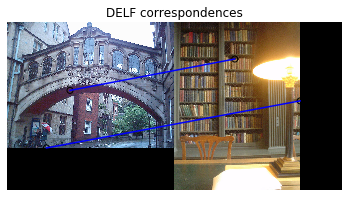

Found inliers for image 72 -> 3


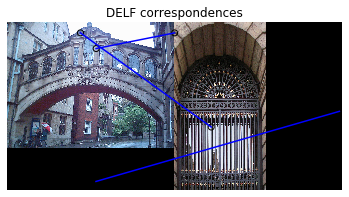

Found inliers for image 100 -> 4


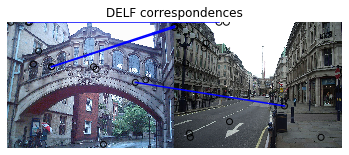

Found inliers for image 114 -> 2


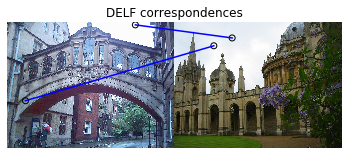

Found inliers for image 119 -> 2


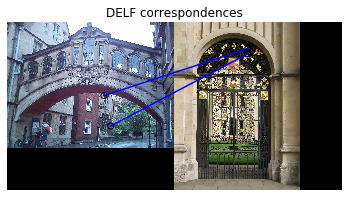

Found inliers for image 122 -> 3


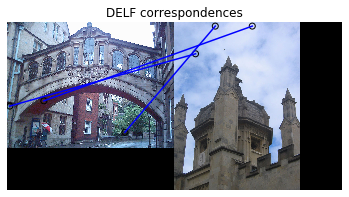

Found inliers for image 126 -> 2


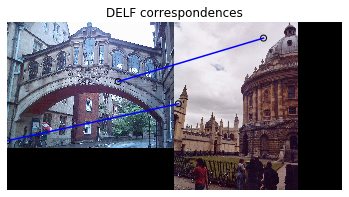

Found inliers for image 132 -> 2


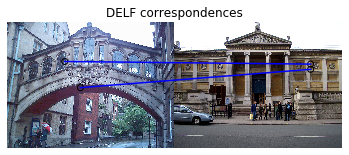

Found inliers for image 133 -> 2


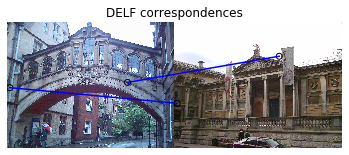

Found inliers for image 134 -> 3


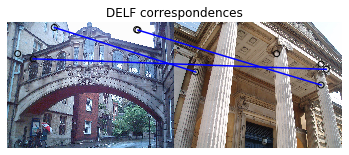

Found inliers for image 136 -> 3


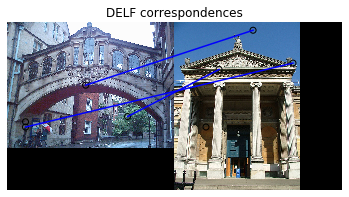

Found inliers for image 139 -> 2


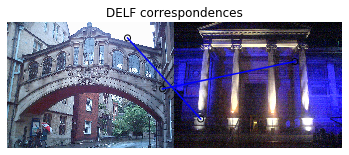

Found inliers for image 140 -> 2


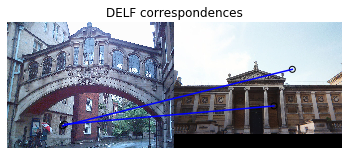

Found inliers for image 141 -> 2


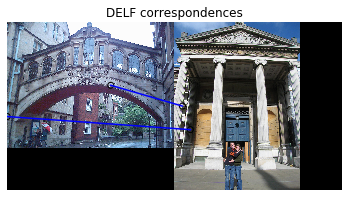

Found inliers for image 144 -> 2


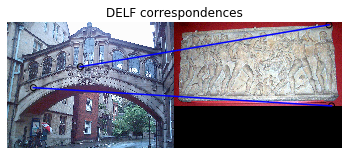

Found inliers for image 145 -> 3


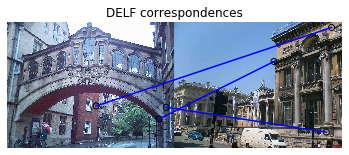

Found inliers for image 146 -> 2


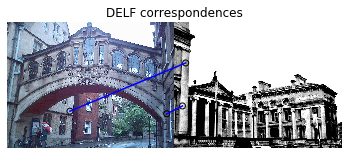

Found inliers for image 147 -> 2


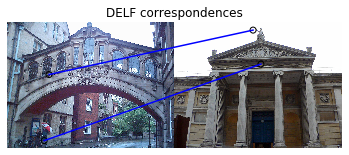

Found inliers for image 155 -> 2


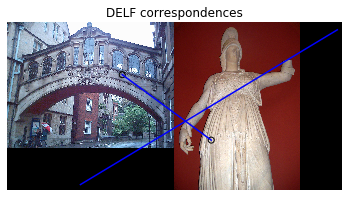

Found inliers for image 159 -> 3


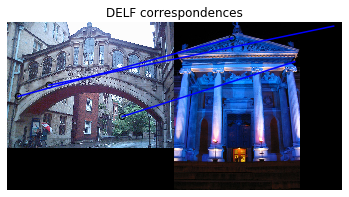

Found inliers for image 162 -> 3


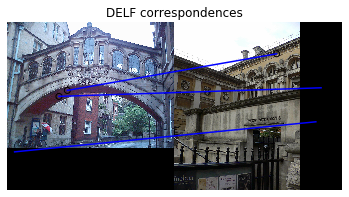

Found inliers for image 163 -> 4


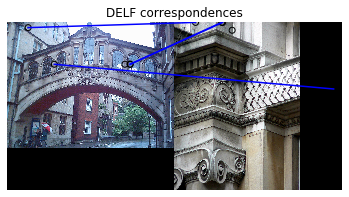

Found inliers for image 165 -> 2


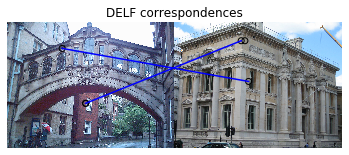

Found inliers for image 166 -> 2


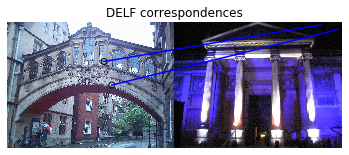

Found inliers for image 170 -> 2


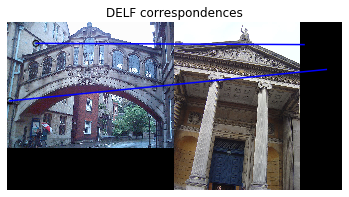

Found inliers for image 187 -> 2


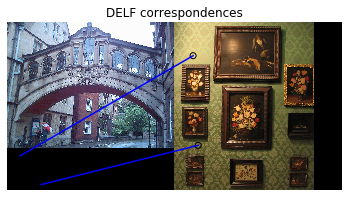

Found inliers for image 195 -> 2


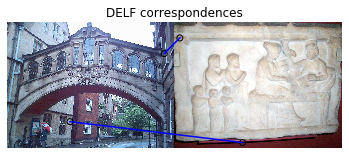

Found inliers for image 202 -> 2


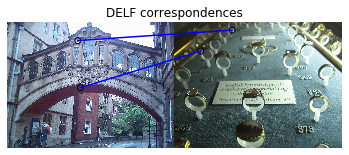

Found inliers for image 209 -> 2


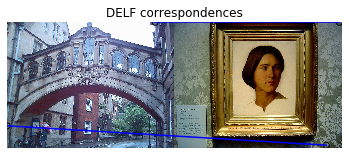

Found inliers for image 222 -> 2


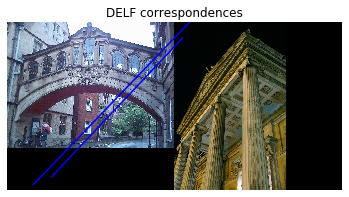

Found inliers for image 251 -> 4


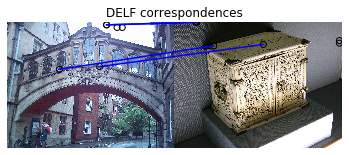

Found inliers for image 256 -> 2


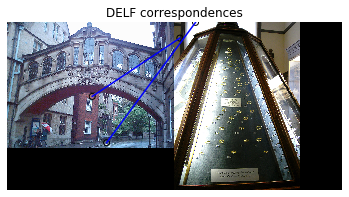

Found inliers for image 279 -> 2


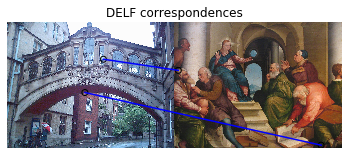

Found inliers for image 301 -> 2


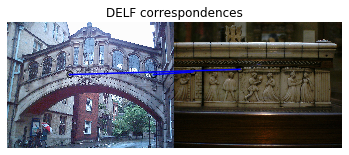

Found inliers for image 304 -> 2


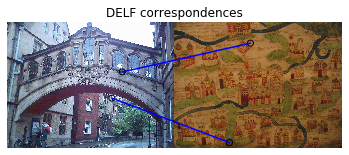

Found inliers for image 306 -> 3


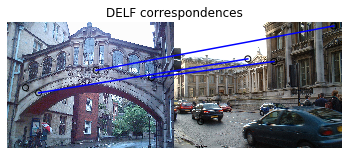

Found inliers for image 307 -> 3


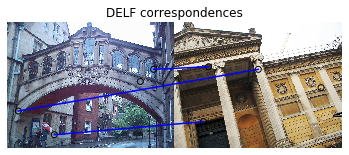

Found inliers for image 315 -> 2


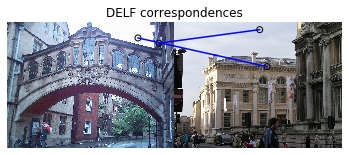

Found inliers for image 317 -> 2


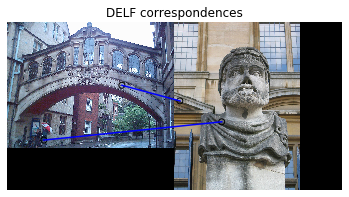

Found inliers for image 321 -> 3


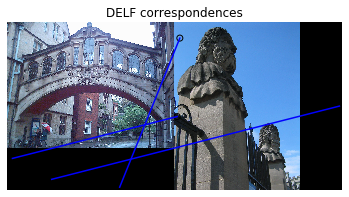

Found inliers for image 323 -> 2


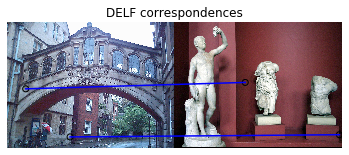

Found inliers for image 344 -> 2


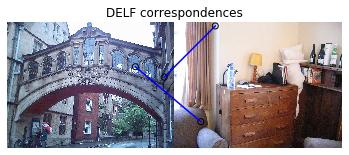

Found inliers for image 347 -> 2


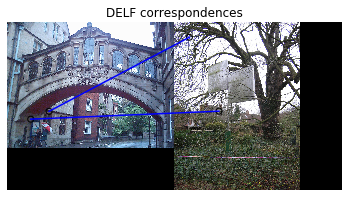

Found inliers for image 362 -> 2


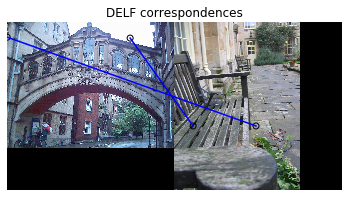

Found inliers for image 365 -> 2


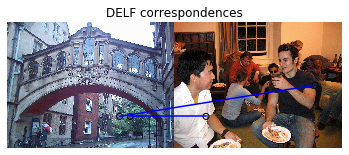

Found inliers for image 370 -> 3


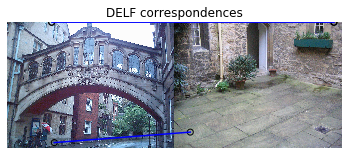

Found inliers for image 371 -> 2


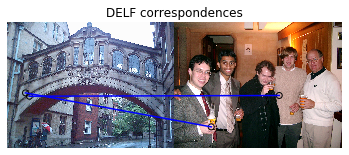

Found inliers for image 379 -> 2


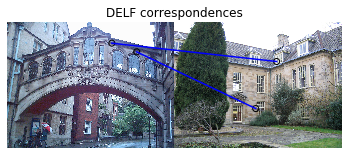

Found inliers for image 397 -> 2


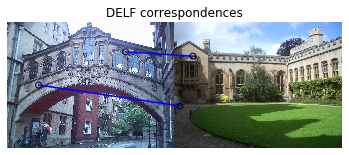

Found inliers for image 410 -> 2


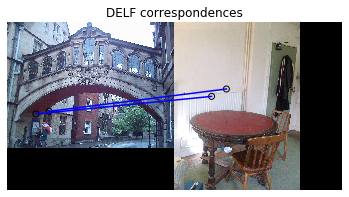

Found inliers for image 418 -> 2


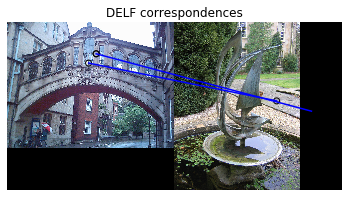

Found inliers for image 444 -> 2


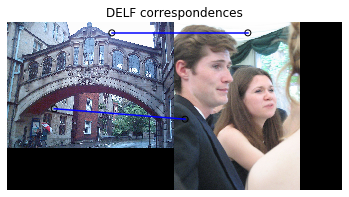

Found inliers for image 461 -> 19


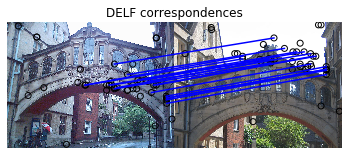

LinAlgError: Arrays cannot be empty

In [51]:
# Array to keep track of all candidates in database.
inliers_counts = []
# Read the resized query image for plotting.
#img_1 = mpimg.imread(resized_image)
img_1 = mpimg.imread(query_image_path)
for index in unique_image_indexes:
    locations_2_use_query, locations_2_use_db = get_locations_2_use(index, indices, accumulated_indexes_boundaries)
    # Perform geometric verification using RANSAC.
    _, inliers = ransac(
        (locations_2_use_db, locations_2_use_query), # source and destination coordinates
        AffineTransform,
        min_samples=3,
        residual_threshold=20,
        max_trials=1000)
    # If no inlier is found for a database candidate image, we continue on to the next one.
    if inliers is None or len(inliers) == 0:
        continue
    # the number of inliers as the score for retrieved images.
    inliers_counts.append({"index": index, "inliers": sum(inliers)})
    print('Found inliers for image {} -> {}'.format(index, sum(inliers)))
    # Visualize correspondences.
    _, ax = plt.subplots()
    img_2 = mpimg.imread(db_images[index])
    inlier_idxs = np.nonzero(inliers)[0]
    plot_matches(
        ax,
        img_1,
        img_2,
        locations_2_use_db,
        locations_2_use_query,
        np.column_stack((inlier_idxs, inlier_idxs)),
        matches_color='b')
    ax.axis('off')
    ax.set_title('DELF correspondences')
    plt.show()

In [52]:
inliers_counts

[{'index': 6, 'inliers': 3},
 {'index': 10, 'inliers': 2},
 {'index': 16, 'inliers': 2},
 {'index': 21, 'inliers': 2},
 {'index': 23, 'inliers': 3},
 {'index': 25, 'inliers': 3},
 {'index': 27, 'inliers': 3},
 {'index': 30, 'inliers': 3},
 {'index': 38, 'inliers': 3},
 {'index': 43, 'inliers': 2},
 {'index': 46, 'inliers': 3},
 {'index': 48, 'inliers': 2},
 {'index': 49, 'inliers': 3},
 {'index': 52, 'inliers': 3},
 {'index': 55, 'inliers': 27},
 {'index': 56, 'inliers': 9},
 {'index': 57, 'inliers': 2},
 {'index': 64, 'inliers': 2},
 {'index': 67, 'inliers': 3},
 {'index': 68, 'inliers': 2},
 {'index': 69, 'inliers': 2},
 {'index': 72, 'inliers': 3},
 {'index': 100, 'inliers': 4},
 {'index': 114, 'inliers': 2},
 {'index': 119, 'inliers': 2},
 {'index': 122, 'inliers': 3},
 {'index': 126, 'inliers': 2},
 {'index': 132, 'inliers': 2},
 {'index': 133, 'inliers': 2},
 {'index': 134, 'inliers': 3},
 {'index': 136, 'inliers': 3},
 {'index': 139, 'inliers': 2},
 {'index': 140, 'inliers': 2},

### Show the top match result
Employ the number of inliers as the score for retrieved images.

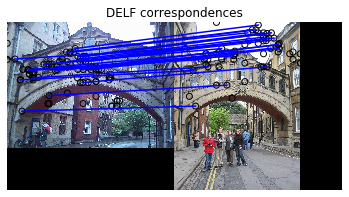

In [53]:
top_match = sorted(inliers_counts, key=lambda k: k['inliers'], reverse=True)[0]

index = top_match['index']
#print('Best guess for this image:', building_descs[index])
locations_2_use_query, locations_2_use_db = get_locations_2_use(index, indices, accumulated_indexes_boundaries)
# Perform geometric verification using RANSAC.
_, inliers = ransac(
    (locations_2_use_db, locations_2_use_query), # source and destination coordinates
    AffineTransform,
    min_samples=3,
    residual_threshold=20,
    max_trials=1000)
# Visualize correspondences.
_, ax = plt.subplots()
img_2 = mpimg.imread(db_images[index])
inlier_idxs = np.nonzero(inliers)[0]
plot_matches(
    ax,
    img_1,
    img_2,
    locations_2_use_db,
    locations_2_use_query,
    np.column_stack((inlier_idxs, inlier_idxs)),
    matches_color='b')
ax.axis('off')
ax.set_title('DELF correspondences')
plt.show()

In [ ]:
import pandas as pd
df = pd.DataFrame(np.unique(locations_agg, axis=0), columns=['x', 'y'])
df.head()

In [ ]:
fig, axe = plt.subplots(ncols=1, figsize = (6,6))
df.plot.scatter(x = 'x', y='y', fontsize=15, ax = axe)
axe.set_ylabel("y", size = 20)
axe.set_xlabel("x", size = 20)
plt.show()

In [ ]:
np.array(accumulated_indexes_boundaries)